In [1]:
import numpy as np 
import pandas as pd 
import os
import shutil
import matplotlib.pyplot as plt
import os
from PIL import Image
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch
from torchvision import transforms, models
import numpy as np
from sklearn.preprocessing import QuantileTransformer
from PIL import Image
df = pd.read_csv('/kaggle/input/hgvoid/hvoid.csv')



In [2]:
def plot_image_grid(df_subset, title, rows=5, cols=5):
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3.5, rows * 3.5))
    fig.suptitle(title, fontsize=20, y=1.03)
    axes = axes.flatten()

    for i, (idx, row) in enumerate(df_subset.iterrows()):
        if i >= rows * cols:
            break

        ax = axes[i]
        img = Image.open(row['image_path']).convert('RGB')
        ax.imshow(img)
        dominant_comp = row['dominant_component'].replace('_norm', '').replace('_score', '')
        ax.set_title(
            f"Label: {row['true_label']}\n"
            f"Void: {row['void_score']:.2f} | Conf: {row['confidence']:.2f}\n"
            f"Dominant: {dominant_comp}", 
            fontsize=9
        )
        ax.axis('off')

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

In [3]:
device = 'cuda'
model = models.efficientnet_b0(pretrained=False)
num_classes = 10  
in_features = model.classifier[1].in_features
model.classifier[1] = torch.nn.Linear(in_features, num_classes)
state_dict = torch.load(
    "/kaggle/input/effnet_tomato/pytorch/default/1/tomato_efficientnet_b0_finetuned.pth",
    map_location="cpu"
)
model.load_state_dict(state_dict)
model = model.to(device)
model.eval()


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

In [4]:
X = np.vstack([df.uncertainty_score,
               df.density_score,
               df.outlier_score]).T  
qt = QuantileTransformer(output_distribution="normal")  
Xn = qt.fit_transform(X)  
U_n = Xn[:, 0]
D_n = Xn[:, 1]
O_n = Xn[:, 2]


In [5]:
alpha_D, alpha_O = 0.6, 0.4
G = alpha_D * D_n + alpha_O * O_n 

In [6]:
cov_UG = np.mean((U_n - U_n.mean()) * (G - G.mean()))
var_G  = np.var(G)
beta   = cov_UG / (var_G + 1e-8)

E_raw = U_n - beta * G   
E = (E_raw - E_raw.mean()) / (E_raw.std() + 1e-8)  

In [7]:
G_q = np.quantile(G, [0.5, 0.8])  
E_q = np.quantile(E, [0.7])       

G_med, G_hi = G_q[0], G_q[1]
E_hi = E_q[0]

core_mask    = (G < G_med) & (E < E_hi)
geom_tail    = (G >= G_hi) & (E < E_hi)
epistemic    = (G < G_hi)  & (E >= E_hi)
chaotic_tail = (G >= G_hi) & (E >= E_hi)


In [8]:
df["core_mask"]    = core_mask
df["geom_tail"]    = geom_tail
df["epistemic"]    = epistemic
df["chaotic_tail"] = chaotic_tail

In [9]:
list = ['core_mask', 'geom_tail', 'epistemic', 'chaotic_tail']
for i in list:
    print(f'{i} value counts')
    print(df[i].value_counts())
    print('*************-----***********')

core_mask value counts
core_mask
False    1329
True      742
Name: count, dtype: int64
*************-----***********
geom_tail value counts
geom_tail
False    1791
True      280
Name: count, dtype: int64
*************-----***********
epistemic value counts
epistemic
False    1584
True      487
Name: count, dtype: int64
*************-----***********
chaotic_tail value counts
chaotic_tail
False    1936
True      135
Name: count, dtype: int64
*************-----***********


In [10]:
df["category"] = "unknown"
df.loc[core_mask,    "category"] = "core"
df.loc[geom_tail,    "category"] = "geom_tail"
df.loc[epistemic,    "category"] = "epistemic"
df.loc[chaotic_tail, "category"] = "chaotic_tail"


In [11]:
df_core         = df[df["category"] == "core"].copy()
df_geom_tail    = df[df["category"] == "geom_tail"].copy()
df_epistemic    = df[df["category"] == "epistemic"].copy()
df_chaotic_tail = df[df["category"] == "chaotic_tail"].copy()
df_unknown      = df[df["category"] == "unknown"].copy()

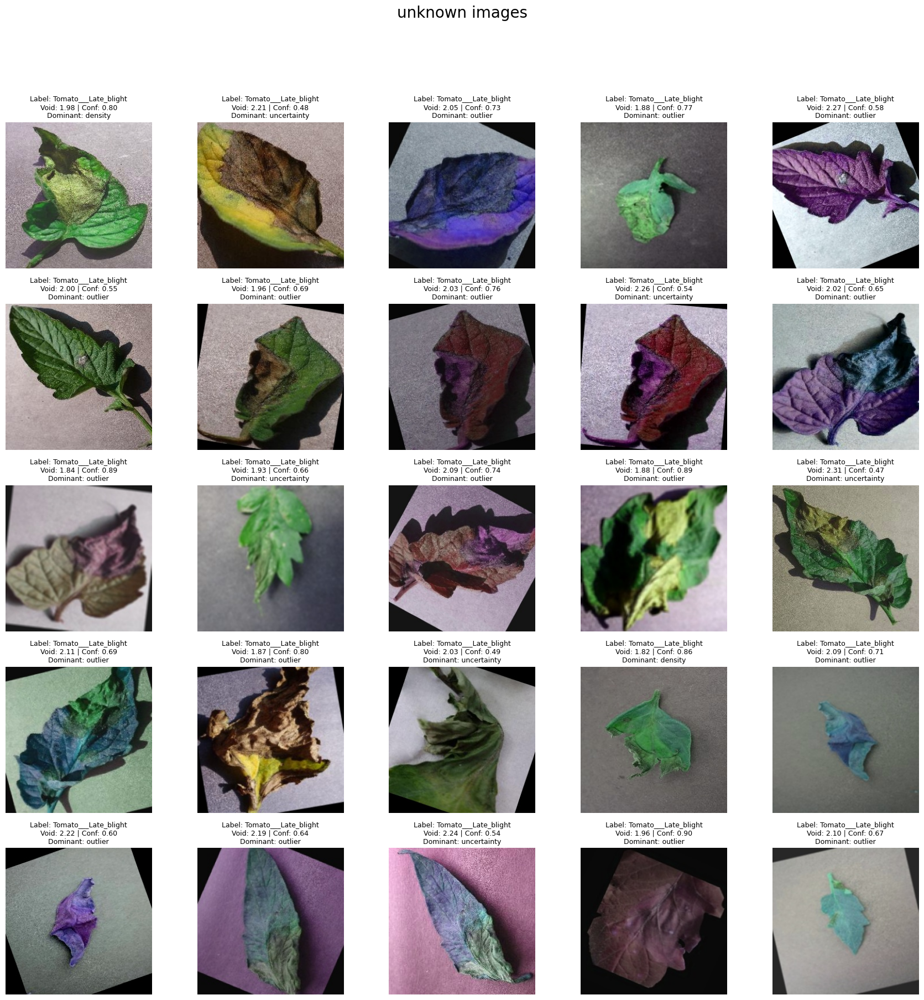

In [12]:
title = 'unknown images'
plot_image_grid(df_unknown, title, rows=5, cols=5)

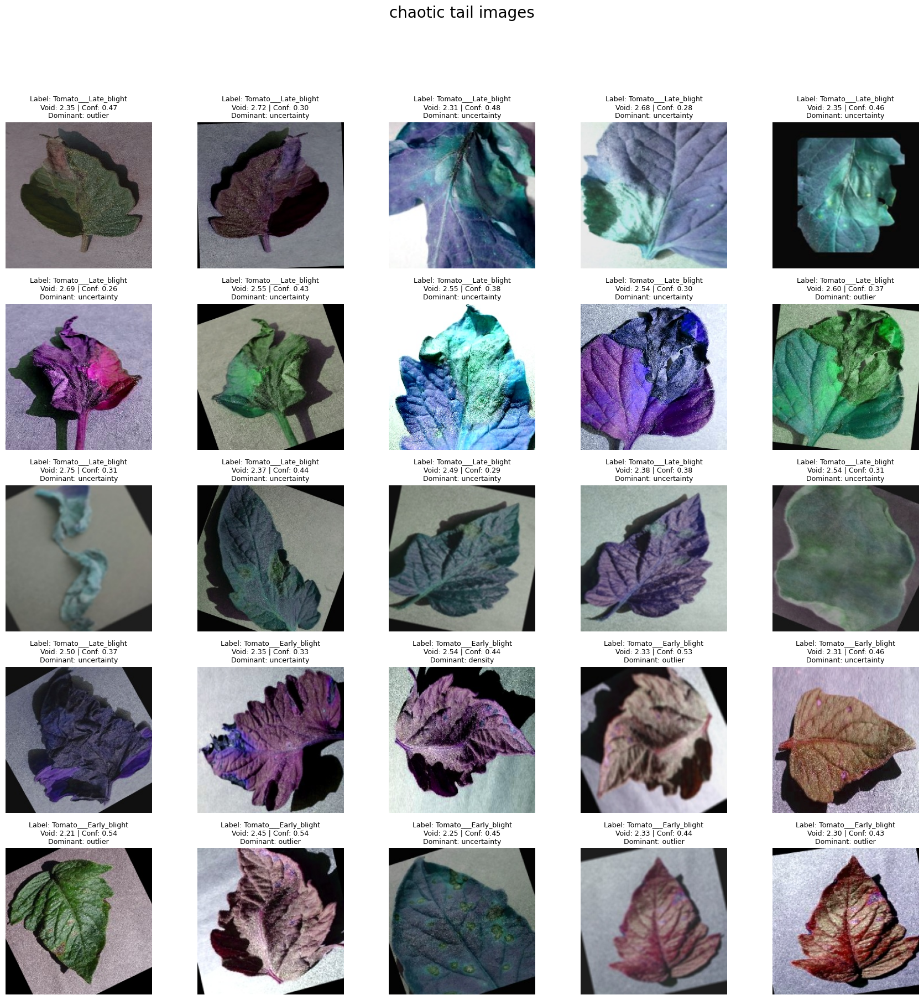

In [13]:
title = 'chaotic tail images'
plot_image_grid(df_chaotic_tail, title, rows=5, cols=5)

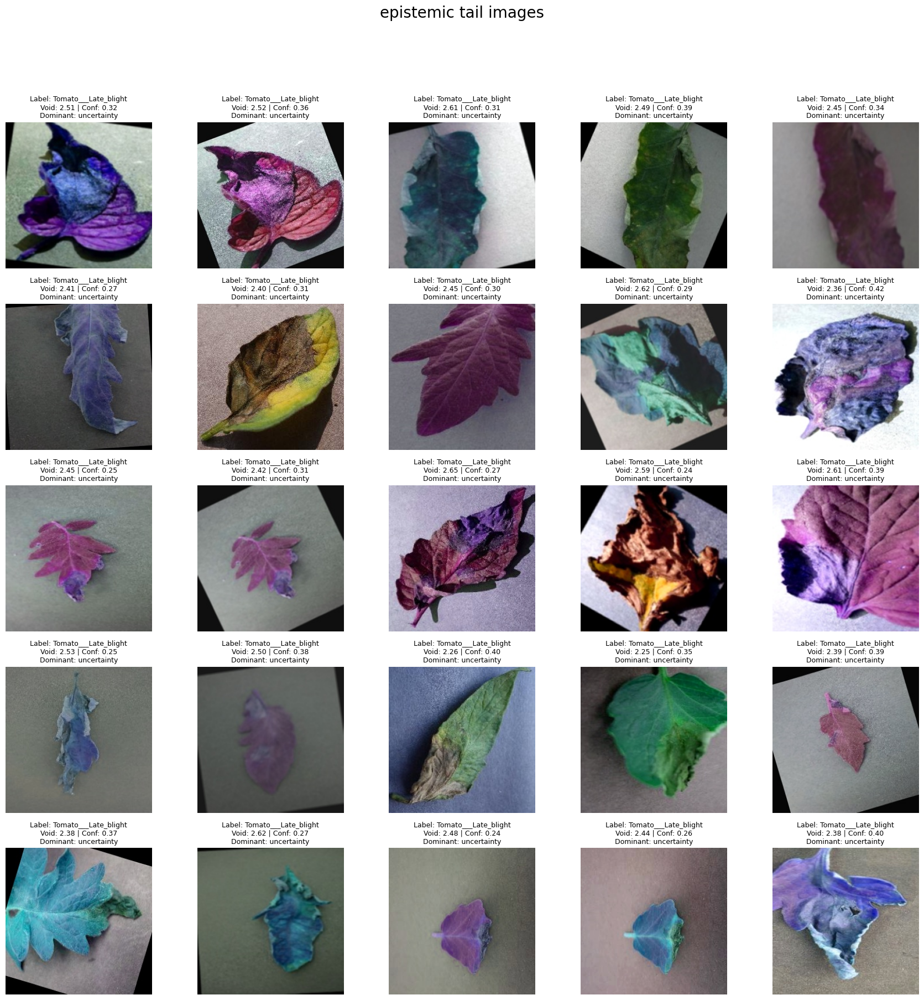

In [14]:
title = 'epistemic tail images'
plot_image_grid(df_epistemic, title, rows=5, cols=5)

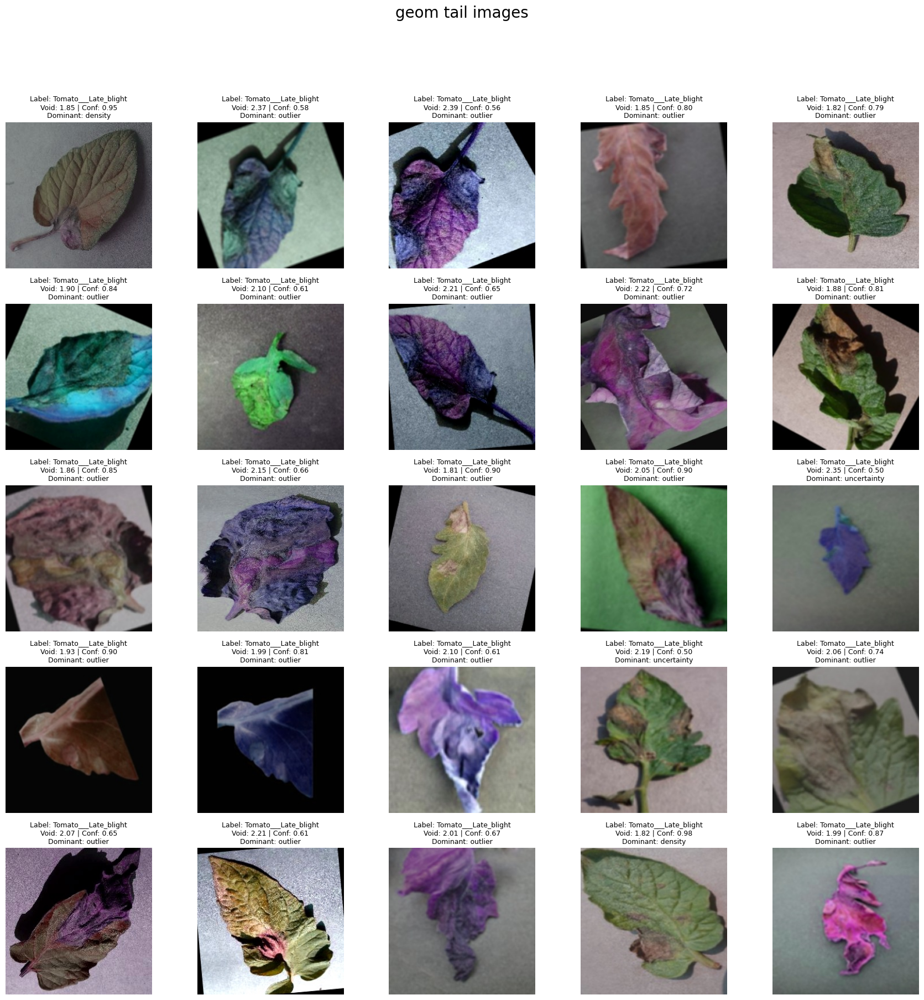

In [15]:
title = 'geom tail images'
plot_image_grid(df_geom_tail, title, rows=5, cols=5)

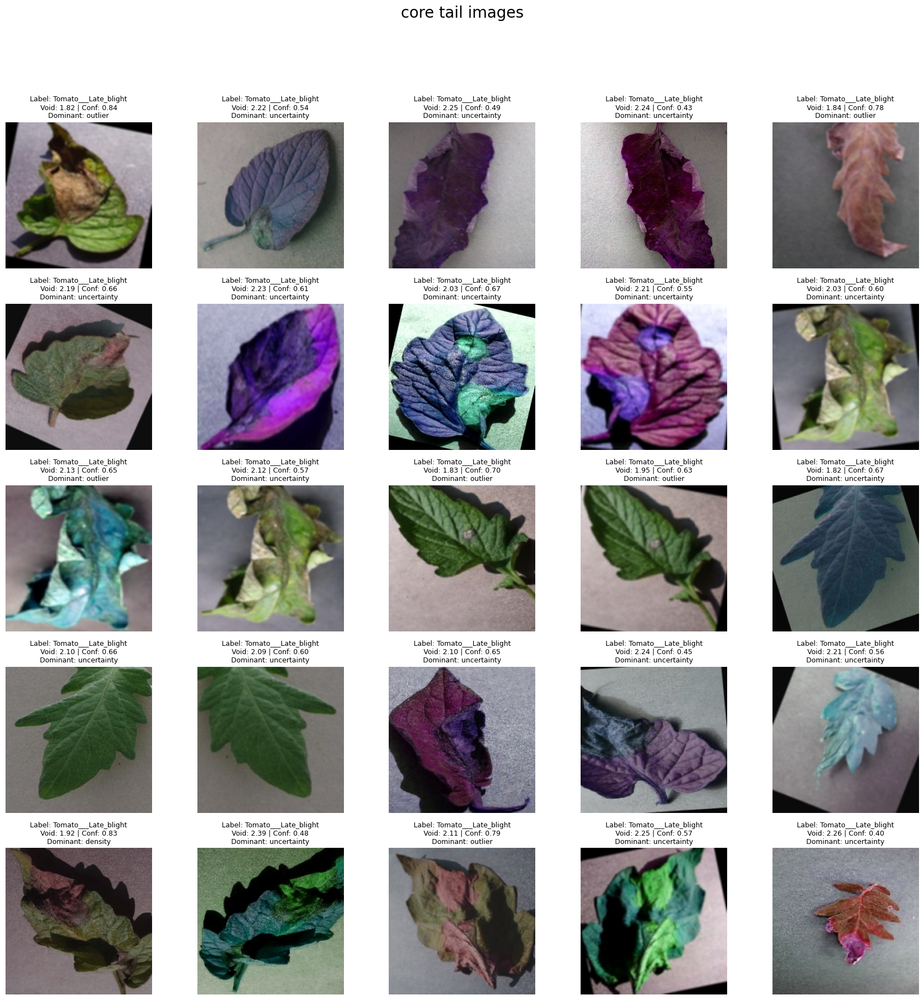

In [16]:
title = 'core tail images'
plot_image_grid(df_core, title, rows=5, cols=5)

### Visual Check of the 5 Latent-Based Clusters
The following grids show the five subsets I obtained using two scores  
derived from the model’s latent space:  
(**G**: geometric compactness/density, **E**: epistemic uncertainty):

- `core`
- `geom_tail`
- `epistemic`
- `chaotic_tail`
- `unknown`

When inspecting these images purely in the RGB domain,  
**there is no clear, visually distinguishable difference between the clusters.**

This is expected:

- The clusters are not based on **pixel-level variation**,  
- but on **geometric and epistemic signals** extracted from the model’s latent representation.

So at this stage, it is not obvious what the separation means just by looking at the images.  
The next step is to project the CNN feature vectors (from EfficientNet’s penultimate layer)  
using **UMAP / PCA** to visualize how the model itself organizes these samples.

If the model separates these five clusters in latent space as well,  
then the partition is genuinely meaningful.  
Otherwise, the current separation may simply be an artifact of the chosen thresholds.

In [17]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model = model.to(device)
model.eval()

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

class TomatoDataset(Dataset):
    def __init__(self, df, image_col="image_path", transform=None):
        self.df = df.reset_index(drop=True)
        self.image_col = image_col
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_path = self.df.loc[idx, self.image_col]
        img = Image.open(img_path).convert("RGB")
        if self.transform is not None:
            img = self.transform(img)
        return img, idx  

dataset = TomatoDataset(df, image_col="image_path", transform=transform)
loader = DataLoader(dataset, batch_size=32, shuffle=False, num_workers=2)

@torch.no_grad()
def extract_features(x):
    x = model.features(x)
    x = model.avgpool(x)
    x = torch.flatten(x, 1) 
    return x
all_features = np.zeros((len(df), 1280), dtype=np.float32)

for batch_imgs, batch_idx in loader:
    batch_imgs = batch_imgs.to(device)
    feats = extract_features(batch_imgs)        
    feats = feats.cpu().numpy()
    all_features[batch_idx.numpy()] = feats    



In [18]:
np.save("/kaggle/working/features.npy", all_features)
cols_to_save = ["image_path", "category", "void_score", "G", "E"]
cols_to_save = [c for c in cols_to_save if c in df.columns]  
df[cols_to_save].to_csv("/kaggle/working/meta.csv", index=False)


# UMAP Visualization for Visual Validation

**Note:** Due to compatibility issues between UMAP and scikit-learn in Kaggle environment, I need to switch platforms for visual validation. Since UMAP cannot be installed in Kaggle alongside scikit-learn, I will perform the visualization part in Google Colab.